** This notebook corresponds to the classifier training and evaluation of the CBSR model **
# Alon Helvits ID: 315531087
# Linoy Ketashvili ID: 316220235

# classification code

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


using decive: cuda
Epoch 0/99
----------
Validation Loss: 0.9258 Acc: 0.4958 Precision: 0.4895
Train Loss: 0.6946 Acc: 0.5607 Precision: 0.5439
Epoch 1/99
----------
Validation Loss: 0.7113 Acc: 0.5458 Precision: 0.5377
Train Loss: 0.6798 Acc: 0.5936 Precision: 0.5793
Epoch 2/99
----------
Validation Loss: 0.6999 Acc: 0.5708 Precision: 0.5626
Train Loss: 0.6603 Acc: 0.6138 Precision: 0.6017
Epoch 3/99
----------
Validation Loss: 0.6814 Acc: 0.6125 Precision: 0.6078
Train Loss: 0.6456 Acc: 0.6371 Precision: 0.6276
Epoch 4/99
----------
Validation Loss: 0.6624 Acc: 0.6208 Precision: 0.6173
Train Loss: 0.6323 Acc: 0.6552 Precision: 0.6488
Epoch 5/99
----------
Validation Loss: 0.6488 Acc: 0.6458 Precision: 0.6433
Train Loss: 0.6158 Acc: 0.6753 Precision: 0.6704
Epoch 6/99
----------
Validation Loss: 0.6333 Acc: 0.6667 Precision: 0.6647
Train Loss: 0.6046 Acc: 0.6918 Precision: 0.6877
Epoch 7/99
----------
Validation Loss: 0.6163 Acc: 0.6917 Precision: 0.6937
Train Loss: 0.5956 Acc: 0.7024

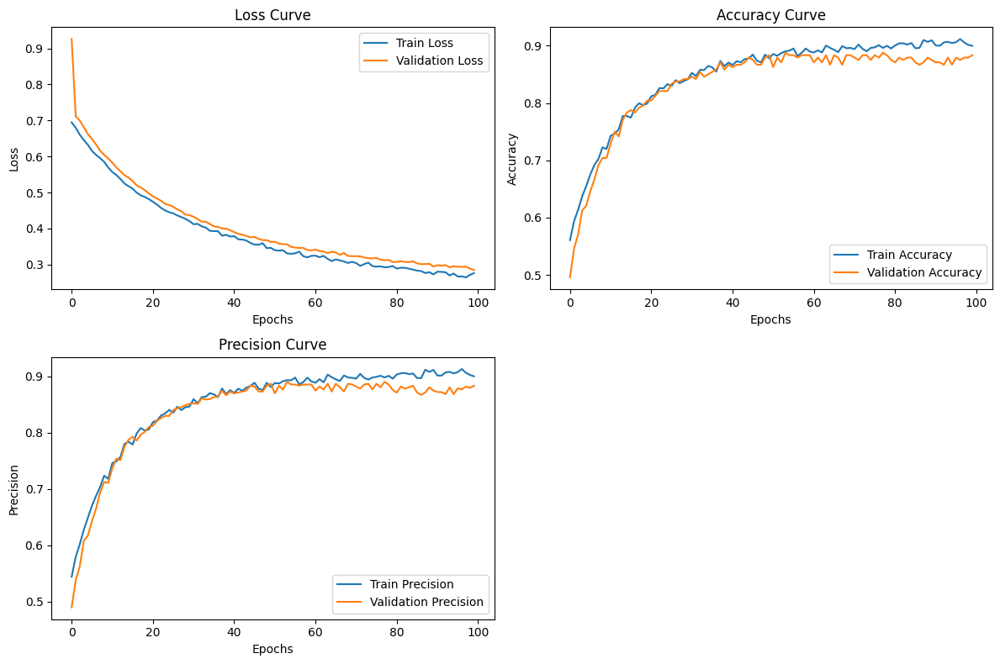

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler,ConcatDataset, Subset
from torchvision import models, transforms
from PIL import Image
import numpy as np
import torch.nn.functional as F
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score
import pickle
import random

# Define the fixed class names and their labels
CLASSES = ['man_made', 'nature']
CLASS_TO_LABEL = {cls: i for i, cls in enumerate(CLASSES)}
LABEL_TO_CLASS = {i: cls for cls, i in CLASS_TO_LABEL.items()}

def compute_mean_std(dataset, num_samples=None):
    loader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=4)
    means = []
    stds = []

    # Use a smaller number of samples if specified
    num_samples = len(dataset) if num_samples is None else num_samples

    for i, (image, _) in enumerate(loader):
        if i >= num_samples:
            break
        image = image.squeeze(0)  # Remove the batch dimension
        # Calculate mean and std for each channel
        means.append(image.mean(dim=[1, 2]).numpy())
        stds.append(image.std(dim=[1, 2]).numpy())

    means = np.mean(means, axis=0)
    stds = np.mean(stds, axis=0)

    return means, stds
# Define the transformation function
def transform():
    return transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize(mean = [0.4518,0.4355,0.4003], std=[0.0506,0.0454,0.0471])
    ])
def transform2():
    return transforms.Compose([
        transforms.ToTensor()
    ])

class Dataset_for_each(Dataset):
    def __init__(self, root_dir, transform=None, class_name=None,state=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = CLASSES
        self.class_to_label = CLASS_TO_LABEL
        self.image_paths = []
        self.labels = []
        valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.gif')


        class_dir = os.path.join(root_dir, class_name)
        class_dir = os.path.join(class_dir,state)
        for img_name in os.listdir(class_dir):
          if img_name.lower().endswith(valid_extensions):
            img_path = os.path.join(class_dir, img_name)
            self.image_paths.append(img_path)
            self.labels.append(self.class_to_label[class_name])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

def predict_image(image_path, model, transform):
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)  # Add batch dimension
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    image = image.to(device)
    model.eval()
    with torch.no_grad():
        output = model(image)
        probabilities = F.softmax(output, dim=1)
        _, predicted_class = torch.max(probabilities, 1)
        class_name = LABEL_TO_CLASS[predicted_class.item()]
    return class_name, probabilities[0][predicted_class.item()].item()


def train_model(model, criterion, optimizer, num_epochs=20):
    train_loss_history = []
    val_loss_history = []
    train_acc_history = []
    val_acc_history = []
    train_precision_history = []
    val_precision_history = []

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        # Validation Phase
        model.eval()
        running_loss = 0.0
        running_corrects = 0
        all_preds = []
        all_labels = []

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        epoch_val_loss = running_loss / len(val_loader.dataset)
        epoch_val_acc = running_corrects.double() / len(val_loader.dataset)
        epoch_val_precision = precision_score(all_labels, all_preds, average='macro')

        print(f'Validation Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f} Precision: {epoch_val_precision:.4f}')

        val_loss_history.append(epoch_val_loss)
        val_acc_history.append(epoch_val_acc.item())
        val_precision_history.append(epoch_val_precision)

        # Training Phase
        model.train()
        running_loss = 0.0
        running_corrects = 0
        all_preds = []
        all_labels = []

        for inputs, labels in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

        epoch_train_loss = running_loss / len(train_loader.dataset)
        epoch_train_acc = running_corrects.double() / len(train_loader.dataset)
        epoch_train_precision = precision_score(all_labels, all_preds, average='macro')

        print(f'Train Loss: {epoch_train_loss:.4f} Acc: {epoch_train_acc:.4f} Precision: {epoch_train_precision:.4f}')

        train_loss_history.append(epoch_train_loss)
        train_acc_history.append(epoch_train_acc.item())
        train_precision_history.append(epoch_train_precision)

    # Save training history
    history = {
        'num_epochs': num_epochs,
        'train_loss_history': train_loss_history,
        'val_loss_history': val_loss_history,
        'train_acc_history': train_acc_history,
        'val_acc_history': val_acc_history,
        'train_precision_history': train_precision_history,
        'val_precision_history': val_precision_history,
    }

    # with open('/content/drive/MyDrive/DIV2K_classified/training_history.pkl', 'wb') as f:
    #     pickle.dump(history, f)

    # Plot learning curves
    plt.figure(figsize=(12, 8))

    # Plot Loss
    plt.subplot(2, 2, 1)
    plt.plot(range(num_epochs), train_loss_history, label='Train Loss')
    plt.plot(range(num_epochs), val_loss_history, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss Curve')

    # Plot Accuracy
    plt.subplot(2, 2, 2)
    plt.plot(range(num_epochs), train_acc_history, label='Train Accuracy')
    plt.plot(range(num_epochs), val_acc_history, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Accuracy Curve')

    # Plot Precision
    plt.subplot(2, 2, 3)
    plt.plot(range(num_epochs), train_precision_history, label='Train Precision')
    plt.plot(range(num_epochs), val_precision_history, label='Validation Precision')
    plt.xlabel('Epochs')
    plt.ylabel('Precision')
    plt.legend()
    plt.title('Precision Curve')

    plt.tight_layout()
    plt.show()

    return model

def get_class_weights_from_datasets(datasets):
    # Combine all labels from the individual datasets
    all_labels = []
    for dataset in datasets:
        all_labels.extend(label for _, label in dataset)

    class_counts = np.bincount(all_labels)
    total_count = len(all_labels)
    class_weights = [total_count / (len(CLASSES) * count) for count in class_counts]
    return torch.tensor(class_weights, dtype=torch.float)

if __name__ == '__main__':
    # Set the data directory
    data_dir = '/content/drive/MyDrive/DIV2K_classified/organized_data_crop_updated'

    data_transform = transform()

    # Create dataloaders
    train_dataset_nature = Dataset_for_each(os.path.join(data_dir), transform=data_transform ,class_name = 'nature',state= 'train')
    val_dataset_nature = Dataset_for_each(os.path.join(data_dir), transform=data_transform,class_name = 'nature',state = 'val')
    test_dataset_neture = Dataset_for_each(os.path.join(data_dir), transform=data_transform,class_name = 'nature',state = 'test')

    train_dataset_man_made = Dataset_for_each(os.path.join(data_dir), transform=data_transform ,class_name = 'man_made',state= 'train')
    val_dataset_man_made = Dataset_for_each(os.path.join(data_dir), transform=data_transform,class_name = 'man_made',state = 'val')
    test_dataset_man_made = Dataset_for_each(os.path.join(data_dir), transform=data_transform,class_name = 'man_made',state = 'test')

    # Get lengths of each class
    len_nature = len(train_dataset_nature)
    len_man_made = len(train_dataset_man_made)

    # Identify the minority and majority classes
    if len_nature < len_man_made:
        minority_dataset = train_dataset_nature
        majority_dataset = train_dataset_man_made
    else:
        minority_dataset = train_dataset_man_made
        majority_dataset = train_dataset_nature

    # Calculate how many times to repeat the minority class to match the majority class size
    repeat_factor = len(majority_dataset) // len(minority_dataset)

    # Create a list of indices to duplicate the minority samples
    minority_indices = list(range(len(minority_dataset)))
    oversample_indices = minority_indices * repeat_factor

    # If necessary, add a few more samples to exactly match the majority class size
    extra_samples_needed = len(majority_dataset) - len(oversample_indices)
    if extra_samples_needed > 0:
        oversample_indices.extend(random.choices(minority_indices, k=extra_samples_needed))

    # Create a subset dataset for oversampling
    oversampled_minority_dataset = Subset(minority_dataset, oversample_indices)

    # Combine the oversampled minority dataset with the majority dataset
    balanced_train_dataset = ConcatDataset([oversampled_minority_dataset, majority_dataset])

    train_dataset =  ConcatDataset([train_dataset_nature,train_dataset_man_made])
    val_dataset = ConcatDataset([val_dataset_nature,val_dataset_man_made])
    test_dataset = ConcatDataset([test_dataset_neture,test_dataset_man_made])

    # train_loader = DataLoader(train_dataset, batch_size=32,sampler=train_sampler, num_workers=2)
    train_loader = DataLoader(balanced_train_dataset, batch_size=32, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)


    # Load the pre-trained ResNet-18 model
    model = models.resnet18(pretrained=True)
    for name, param in model.named_parameters():
      if "layer3" in name or "layer9" or "layer13" in name:
        param.requires_grad = False
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, len(CLASSES))
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print("using decive:",device)
    model.to(device)

    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.00001,weight_decay=1e-3)

    # Train the model
    model = train_model(model, criterion, optimizer, num_epochs=100)
    torch.save(model, '/content/drive/MyDrive/DIV2K_classified/model_cropped_100_epochs.pth')
    torch.save(model, 'model_cropped_100_epochs_today.pth')

# per class accuracy on test

In [ ]:
import os
import torch
import torch.nn.functional as F
from PIL import Image
from torchvision import transforms

# Define the fixed class names and their labels
CLASSES = ['man_made', 'nature']
CLASS_TO_LABEL = {cls: i for i, cls in enumerate(CLASSES)}
LABEL_TO_CLASS = {i: cls for cls, i in CLASS_TO_LABEL.items()}

# Define the transformation function
def transform():
    return transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean = [0.4518,0.4355,0.4003], std=[0.0506,0.0454,0.0471])
    ])

def calculate_class_accuracy(model, data_dir):
    # Set the model to evaluation mode
    model.eval()
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.gif')
    # Initialize variables to keep track of correct predictions and total samples per class
    correct_preds = {cls: 0 for cls in CLASSES}
    total_samples = {cls: 0 for cls in CLASSES}

    # Iterate over each class folder
    for class_name in CLASSES:
        class_dir = os.path.join(data_dir, class_name, 'test')
        for img_name in os.listdir(class_dir):
          if img_name.lower().endswith(valid_extensions):
            img_path = os.path.join(class_dir, img_name)

            # Load the image
            image = Image.open(img_path).convert('RGB')
            image = transform()(image).unsqueeze(0)  # Add batch dimension

            # Move the image to the device (GPU or CPU)
            device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
            image = image.to(device)

            # Disable gradient computation for inference
            with torch.no_grad():
                # Forward pass: compute the output
                output = model(image)

                # Apply softmax to get probabilities
                probabilities = F.softmax(output, dim=1)

                # Get the predicted class
                _, predicted_class = torch.max(probabilities, 1)

            # Compare the prediction with the true label
            true_label = CLASS_TO_LABEL[class_name]
            total_samples[class_name] += 1
            if predicted_class.item() == true_label:
                correct_preds[class_name] += 1

    # Calculate and print per-class accuracy
    for class_name in CLASSES:
        accuracy = correct_preds[class_name] / total_samples[class_name] * 100
        print(f"Accuracy for class '{class_name}': {accuracy:.2f}% ({correct_preds[class_name]}/{total_samples[class_name]})")

if __name__ == '__main__':
    # Load your trained model (assume it's saved as 'model.pth')

    model = torch.load('model_cropped_100_epochs.pth')
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    # Path to the organized data directory
    data_dir = '/content/drive/MyDrive/DIV2K_classified/organized_data_crop_updated'

    # Calculate per-class accuracy
    calculate_class_accuracy(model, data_dir)

Accuracy for class 'man_made': 85.09% (97/114)
Accuracy for class 'nature': 94.16% (129/137)


# per class accuracy on validation

Accuracy for class 'man_made': 82.57% (90/109)
Accuracy for class 'nature': 91.60% (120/131)


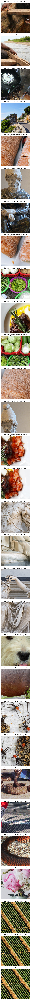

In [ ]:
import os
import torch
import torch.nn.functional as F
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

# Define the fixed class names and their labels
CLASSES = ['man_made', 'nature']
CLASS_TO_LABEL = {cls: i for i, cls in enumerate(CLASSES)}
LABEL_TO_CLASS = {i: cls for cls, i in CLASS_TO_LABEL.items()}

# Define the transformation function
def transform():
    return transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.4518, 0.4355, 0.4003], std=[0.0506, 0.0454, 0.0471])
    ])

def calculate_class_accuracy(model, data_dir):
    # Set the model to evaluation mode
    model.eval()
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.gif')
    # Initialize variables to keep track of correct predictions and total samples per class
    correct_preds = {cls: 0 for cls in CLASSES}
    total_samples = {cls: 0 for cls in CLASSES}
    incorrect_images = []  # List to store (image, true_label, predicted_label) for incorrect predictions

    # Iterate over each class folder
    for class_name in CLASSES:
        class_dir = os.path.join(data_dir, class_name, 'val')
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(valid_extensions):
                img_path = os.path.join(class_dir, img_name)

                # Load the image
                image = Image.open(img_path).convert('RGB')
                image_tensor = transform()(image).unsqueeze(0)  # Add batch dimension

                # Move the image to the device (GPU or CPU)
                device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
                image_tensor = image_tensor.to(device)

                # Disable gradient computation for inference
                with torch.no_grad():
                    # Forward pass: compute the output
                    output = model(image_tensor)

                    # Apply softmax to get probabilities
                    probabilities = F.softmax(output, dim=1)

                    # Get the predicted class
                    _, predicted_class = torch.max(probabilities, 1)

                # Compare the prediction with the true label
                true_label = CLASS_TO_LABEL[class_name]
                total_samples[class_name] += 1
                if predicted_class.item() == true_label:
                    correct_preds[class_name] += 1
                else:
                    # Append incorrect predictions with image, true label, and predicted label
                    incorrect_images.append((image, class_name, LABEL_TO_CLASS[predicted_class.item()]))

    # Calculate and print per-class accuracy
    for class_name in CLASSES:
        accuracy = correct_preds[class_name] / total_samples[class_name] * 100
        print(f"Accuracy for class '{class_name}': {accuracy:.2f}% ({correct_preds[class_name]}/{total_samples[class_name]})")

    # Plot incorrect predictions
    if incorrect_images:
        plot_incorrect_images(incorrect_images)

def plot_incorrect_images(incorrect_images):
    # Set up the plot
    plt.figure(figsize=(12, len(incorrect_images) * 4))
    for i, (image, true_label, predicted_label) in enumerate(incorrect_images):
        plt.subplot(len(incorrect_images), 1, i + 1)
        plt.imshow(image)
        plt.title(f"True: {true_label}, Predicted: {predicted_label}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

if __name__ == '__main__':
    # Load your trained model (assume it's saved as 'model.pth')
    model = torch.load('model_cropped_100_epochs.pth')
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    # Path to the organized data directory
    data_dir = '/content/drive/MyDrive/DIV2K_classified/organized_data_crop_updated'

    # Calculate per-class accuracy and plot incorrect predictions
    calculate_class_accuracy(model, data_dir)
